In [34]:
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from cv22_lab1_part2_utils import interest_points_visualization
from cv22_lab1_part2_utils import disk_strel
from matplotlib import rcParams

2.1 Ανίχνευση Γωνιών

In [35]:
def anixnefsi_gonion(Img_BGR, img_Grey, sigma, p, theta_corn, k):
    Image = img_Grey.astype(np.float)/255
    n = int(np.ceil(3*sigma)*2+1)
    gaussian = cv2.getGaussianKernel(n,sigma) 
    Gs = gaussian @ gaussian.T
    Is = cv2.filter2D(Image, -1, Gs)
    
    n = int(np.ceil(3*p)*2+1)
    gaussian = cv2.getGaussianKernel(n,p) 
    Gp = gaussian @ gaussian.T
    
    [Ix,Iy]=np.gradient(Is)
    J1 = cv2.filter2D(Ix*Ix, -1, Gp)
    J2 = cv2.filter2D(Ix*Iy, -1, Gp)
    J3 = cv2.filter2D(Iy*Iy, -1, Gp)
    
    lplus=(J1+J3+np.sqrt((J1-J3)**2+4*J2**2))/2
    lminus=(J1+J3-np.sqrt((J1-J3)**2+4*J2**2))/2
    
    R = lminus * lplus - k*(lminus + lplus)**2
    ns = np.ceil(3*sigma)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta_corn*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8) # or &
    
    coords = np.nonzero(corners == 1)                  
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([coords[1][i],coords[0][i],2])  
        
    img = cv2.cvtColor(Img_BGR, cv2.COLOR_BGR2RGB)
    temp = interest_points_visualization(img, kp_data)
    return corners

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


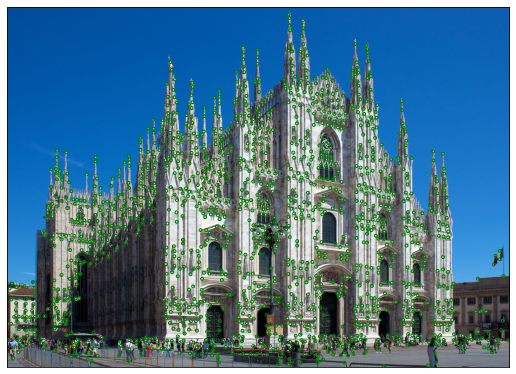

In [36]:
ImgBGR = cv2.imread('duomo_edges.jpg')
ImgGrey = cv2.imread('duomo_edges.jpg', cv2.IMREAD_GRAYSCALE)
temp = anixnefsi_gonion(ImgBGR,ImgGrey,2,2,0.005,0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


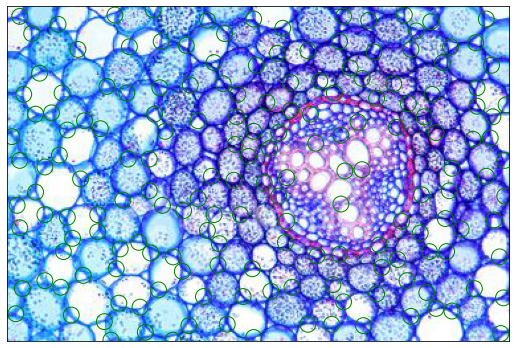

In [37]:
ImgBGR = cv2.imread('cells.jpg')
ImgGrey = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
temp = anixnefsi_gonion(ImgBGR,ImgGrey,1.5,2,0.005,0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


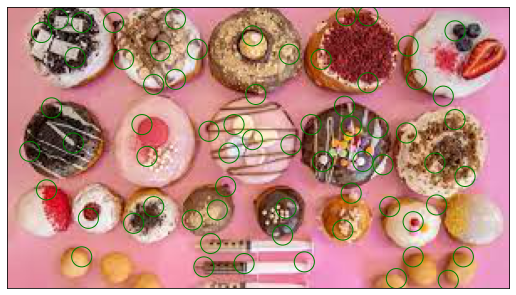

In [38]:
ImgBGR = cv2.imread('donuts.jpg')
ImgGrey = cv2.imread('donuts.jpg', cv2.IMREAD_GRAYSCALE)
temp = anixnefsi_gonion(ImgBGR,ImgGrey,1.5,2,0.005,0.05)

2.2. Πολυκλιμακωτή Ανίχνευση Γωνιών

In [39]:
def HarrisStephens(Img_BGR,img_Grey,N,s0,p0,s,theta_corn,k):
    sigma = []
    rho = []
    L = []
    coords = [] 
    kp_data2 = []
    I = img_Grey.astype(np.float)/255
    corners = []
    
    for i in range(N):
        sigma.append(s**i*s0)                   
        rho.append(s**i*p0)
        corners.append(anixnefsi_gonion(Img_BGR,img_Grey,sigma[i],rho[i],theta_corn,k))
        
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)
        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))
        
    for i in range(4):
        coords.append(np.nonzero(corners[i] == 1))
        for j in range(np.sum(corners[i])):
            current = L[i][coords[i][0][j]][coords[i][1][j]]
            
            if i == 0:
                previous = L[N-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]
                
            elif i == N-1:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[0][coords[i][0][j]][coords[i][1][j]]
                
            else:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]
                
            if (current > previous) & (current > Next):
                kp_data2.append([coords[i][1][j],coords[i][0][j],sigma[i]])
                  
    img = cv2.cvtColor(Img_BGR, cv2.COLOR_BGR2RGB)
    interest_points_visualization(img, kp_data2) 

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys
C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


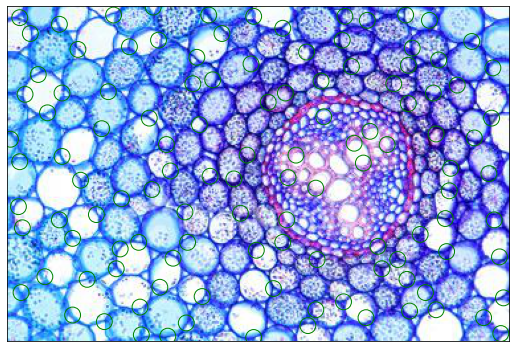

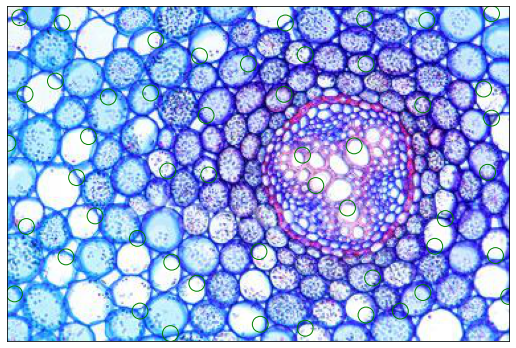

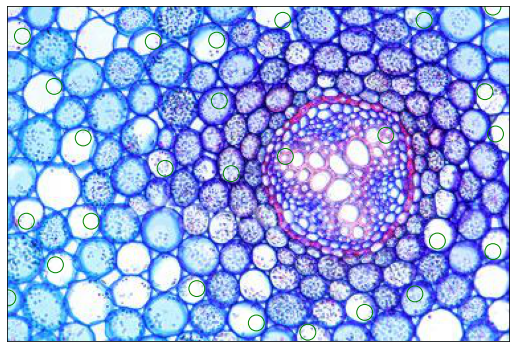

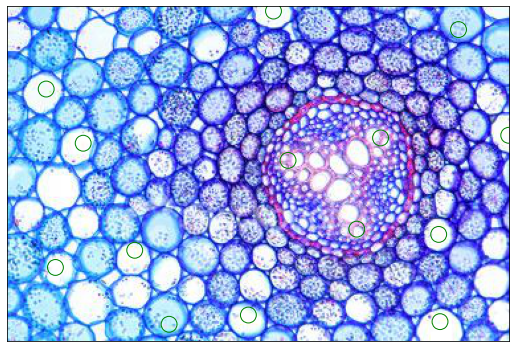

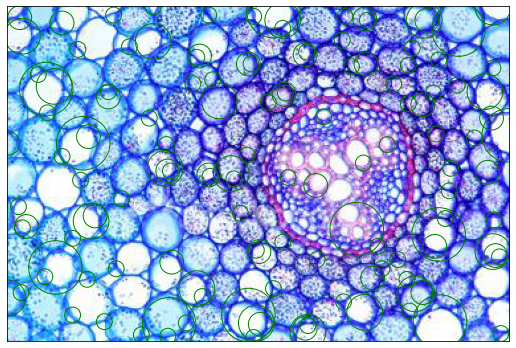

In [40]:
ImgBGR = cv2.imread('cells.jpg')
imgGrey = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
HarrisStephens(ImgBGR,imgGrey,4,2,2.5,1.5,0.005,0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys
C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


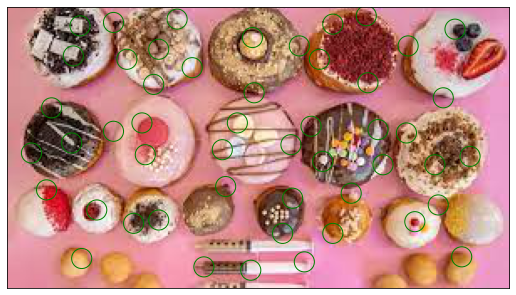

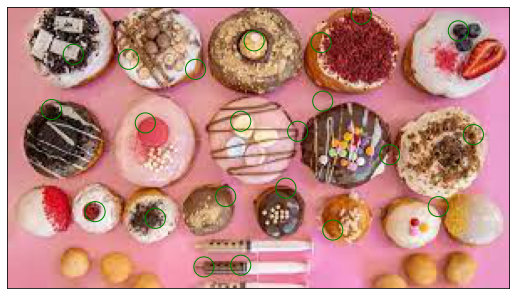

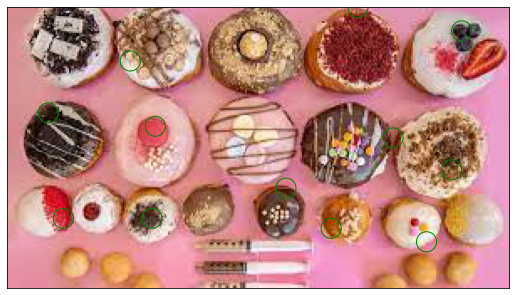

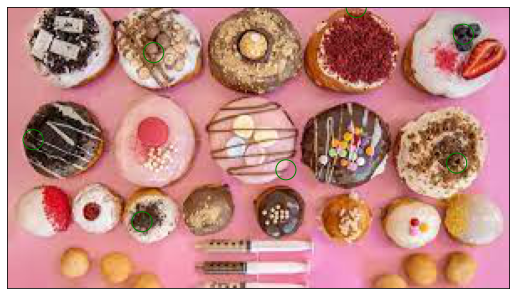

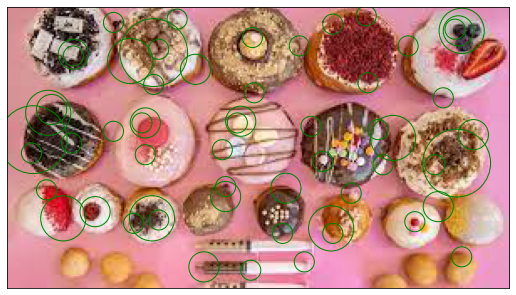

In [41]:
ImgBGR = cv2.imread('donuts.jpg')
imgGrey = cv2.imread('donuts.jpg', cv2.IMREAD_GRAYSCALE)
HarrisStephens(ImgBGR,imgGrey,4,2,2.5,1.5,0.005,0.05)

2.3. Ανίχνευση Blobs

2.3.1

In [42]:
def get_L (I, sigma):
    kernelSize = int (np.ceil(3 * sigma)*2 + 1)
    
    coeff = 1/(2*np.pi*sigma**2)
    x = np.linspace(-(kernelSize-1)/2, (kernelSize-1)/2, kernelSize)
    y = np.linspace(-(kernelSize-1)/2, (kernelSize-1)/2, kernelSize)
    
    X, Y = np.meshgrid(x,y)
    
    Gx = np.exp(-np.square(x)/(2*sigma**2))
    Gy = np.exp(-np.square(y)/(2*sigma**2))
    
    newX = (np.square(x)-sigma**2)/(sigma**4) * Gx
    newY = (np.square(y)-sigma**2)/(sigma**4) * Gy

    gridX, gridY       = np.meshgrid(Gx, Gy)
    gridNewX, gridNewY = np.meshgrid(newX, newY)
    
    ddx = coeff * (gridY*gridNewX)
    ddy = coeff * (gridX*gridNewY)
    dxy = (X*Y/sigma**4) * coeff * gridX*gridY
    
    Lxx = cv2.filter2D(I, -1, ddx)
    Lxy = cv2.filter2D(I, -1, dxy)
    Lyy = cv2.filter2D(I, -1, ddy)
    
    return Lxx, Lxy, Lyy

In [43]:
def blob_criterion (I, sigma):
    Lxx, Lxy, Lyy = get_L(I, sigma)
    R = Lxx*Lyy - Lxy*Lxy
    return R

In [44]:
sigma = 2
Theta_corn = 0.005
k=0.05
n = int(np.ceil(3*sigma)*2+1)
gaussian = cv2.getGaussianKernel(n,sigma) 
gauss2D = gaussian @ gaussian.T

Imgcells = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
Imgcells = Imgcells.astype(np.float)/255
Imgdonuts = cv2.imread('donuts.jpg', cv2.IMREAD_GRAYSCALE)
Imgdonuts = Imgdonuts.astype(np.float)/255

Iscells= cv2.filter2D(Imgcells, -1, gauss2D)
Rcells = blob_criterion(Iscells,sigma)
Isdonuts= cv2.filter2D(Imgdonuts, -1, gauss2D)
Rdonuts = blob_criterion(Isdonuts,sigma)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_p

2.3.2

In [45]:
def needed_conditions (R, sigma, theta):
    # condition 1
    ns = np.ceil(3*sigma)*2 + 1
    B_sq = disk_strel(ns)
    Cond1 = np.where(R == cv2.dilate(R,B_sq), 1, 0)
    
    # condition 2
    Rmax = np.amax(R)
    Cond2 = np.where(R > theta*Rmax, 1, 0)
    
    both = np.where(Cond1 & Cond2, 1, 0)
    return both

def get_kp_data (points: np.ndarray, sigma: float) -> np.ndarray:
    kp_data = np.array([[-1,-1,-1]])
    
    for iy, ix in np.ndindex(points.shape):
        if points[iy][ix]:
            temp = np.array( [[ix, iy, sigma]] )
            kp_data = np.vstack((kp_data,temp))

    return kp_data[1:]

def blob_detect(I, sigma, theta_blob):
    R = blob_criterion(I, sigma)
    blobs = needed_conditions(R, sigma, theta_blob)
    kp_data = get_kp_data(blobs, sigma)
    return kp_data

<AxesSubplot:>

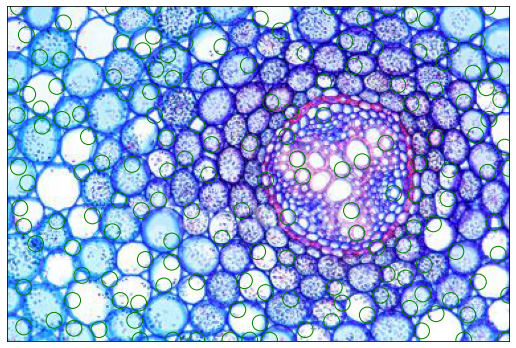

In [46]:
B = blob_detect(Iscells,sigma,Theta_corn)

cells_src  = 'cells.jpg'
cells      = np.array(cv2.imread(cells_src, 1))
RGB_cells  = cv2.cvtColor(cells, cv2.COLOR_BGR2RGB)

rcParams['figure.figsize'] = 9,9
interest_points_visualization(RGB_cells,B)

<AxesSubplot:>

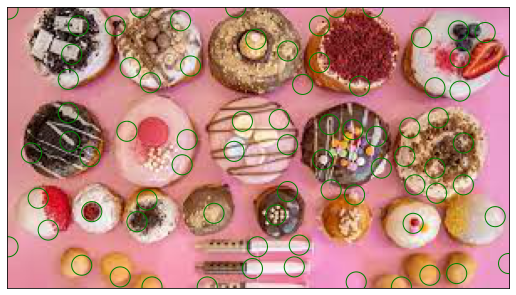

In [47]:
B = blob_detect(Isdonuts,sigma,Theta_corn)

donuts_src  = 'donuts.jpg'
donuts      = np.array(cv2.imread(donuts_src, 1))
RGB_donuts  = cv2.cvtColor(donuts, cv2.COLOR_BGR2RGB)

rcParams['figure.figsize'] = 9,9
interest_points_visualization(RGB_donuts,B)

2.4. Πολυκλιμακωτή Ανίχνευση Blobs

In [48]:
def blob_detect(Image,Img_BGR,sigma,Theta_corn,k):
    Img = Image.astype(np.float)/Image.max()
    
    n = int(np.ceil(3*sigma)*2+1)
    gaussian = cv2.getGaussianKernel(n,sigma) 
    gauss2D = gaussian @ gaussian.T
    Is= cv2.filter2D(Img, -1, gauss2D)
    
    [Lx,Ly] = np.gradient(Is)
    [Lxx,Lxy] = np.gradient(Lx)
    [Lyx,Lyy] = np.gradient(Ly)
    R = Lxx * Lyy - Lxy * Lxy
    ns = np.ceil(3*sigma)*2+1       
    
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > Theta_corn*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8)
    
    coords = np.nonzero(corners == 1)                  #
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([coords[1][i],coords[0][i],sigma]) 
        
    img = cv2.cvtColor(Img_BGR, cv2.COLOR_BGR2RGB)
    return corners
def multi_blob_detect(Img_BGR,img_Grey,N,s0,s,theta_corn,k):
    sigma = []
    L = []
    coords = [] 
    kp_data2 = []
    I = img_Grey.astype(np.float)/img_Grey.max()
    corners = []
    
    for i in range(N):
        sigma.append(s**i*s0)                   
        corners.append(blob_detect(img_Grey,Img_BGR,sigma[i],theta_corn,k))
    
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)

        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))
        
    for i in range(4):
        coords.append(np.nonzero(corners[i] == 1))
        for j in range(np.sum(corners[i])):
            current = L[i][coords[i][0][j]][coords[i][1][j]]
            
            if i == 0:
                previous = L[N-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]
                
            elif i == N-1:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[0][coords[i][0][j]][coords[i][1][j]]
                
            else:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]
                
            if (current > previous) & (current > Next):
                kp_data2.append([coords[i][1][j],coords[i][0][j],sigma[i]]) #1,0
                
    img = cv2.cvtColor(Img_BGR, cv2.COLOR_BGR2RGB)
    interest_points_visualization(img, kp_data2)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:32: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


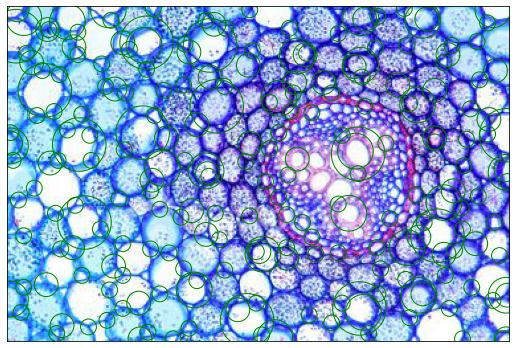

In [49]:
ImgBGR = cv2.imread('cells.jpg')
imgGrey = cv2.imread('cells.jpg', cv2.IMREAD_GRAYSCALE)
multi_blob_detect(ImgBGR,imgGrey,4,2,1.5,0.005,0.05) 

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:32: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


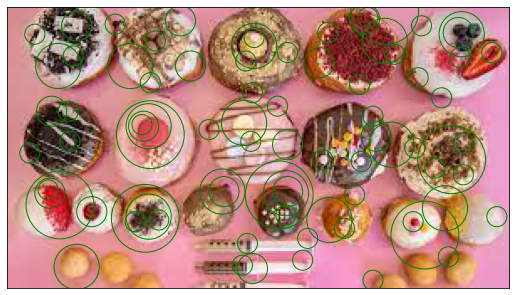

In [50]:
ImgBGR = cv2.imread('donuts.jpg')
imgGrey = cv2.imread('donuts.jpg', cv2.IMREAD_GRAYSCALE)
multi_blob_detect(ImgBGR,imgGrey,4,2,1.5,0.005,0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


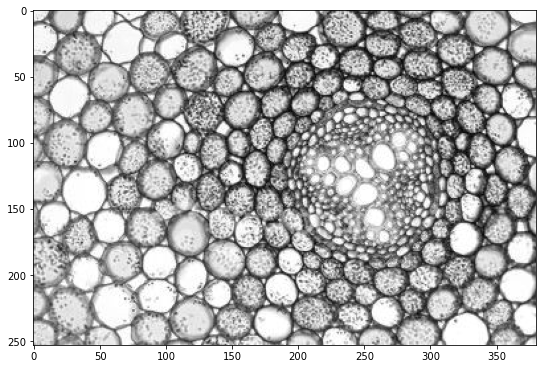

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


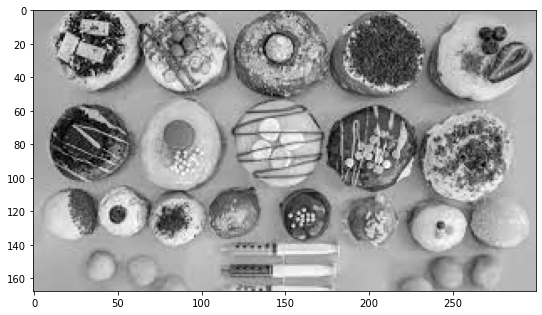

In [51]:
#2.5.1
img1 = cv2.imread('cells.jpg',cv2.IMREAD_GRAYSCALE);
I1 = img1.astype(np.float)/255
#plt.imshow(I1, cmap='gray')
#plt.show()

img2 = cv2.imread('donuts.jpg',cv2.IMREAD_GRAYSCALE);
I2 = img2.astype(np.float)/255
#plt.imshow(I2, cmap='gray')
#plt.show()

def hessian(image,sn):
    #Iss = gaussian(sn)
    #Is = cv2.filter2D(image, -1, Iss)
    S = np.cumsum(image,axis=0)
    S = np.cumsum(image,axis=1)
    return S
h1=hessian(I1,1)
h2=hessian(I2,1)

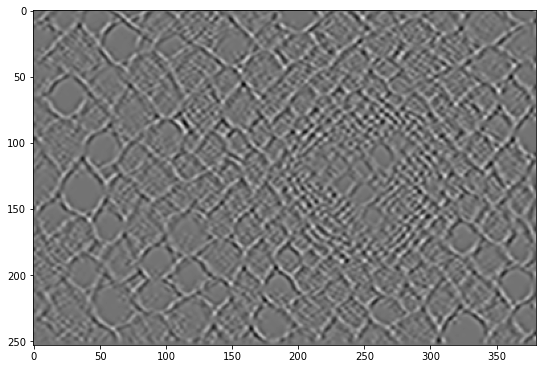

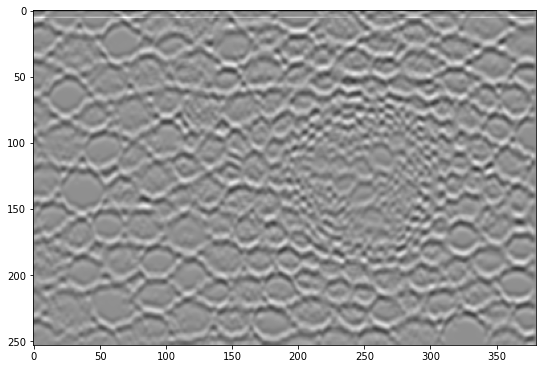

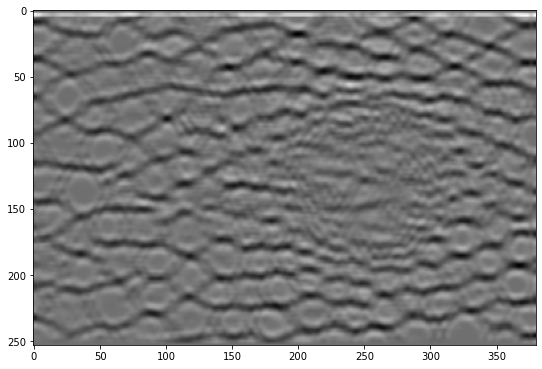

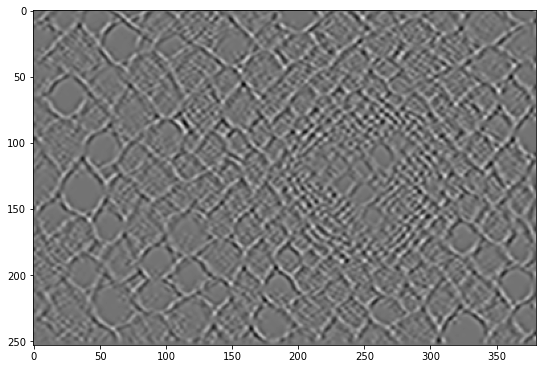

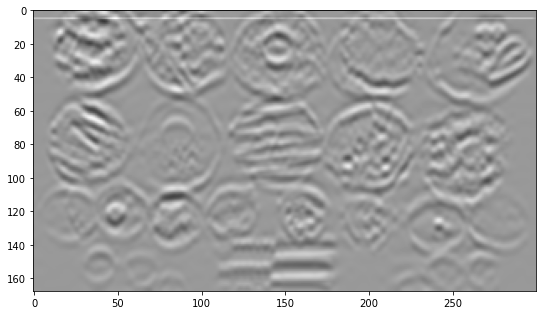

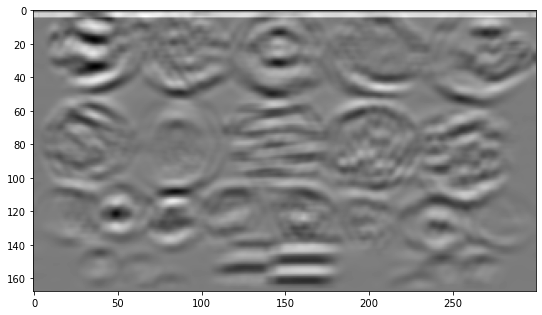

In [52]:
#2.5.2
def gaussian(sn):
    n = int (2*np.ceil(3*sn)+1)
    gaus = cv2.getGaussianKernel(n, sn)
    gaus = gaus @ gaus.transpose()
    return gaus

def initialfilter (image, sn, h, w):
    S = hessian(image,sn)
    S = np.pad(S, ((h,0), (h,0)))
    S = np.pad(S, ((0,w), (0,w)), mode = 'edge')

    xf = int((w+1)/2 - 1)
    yf = int((h+1)/2 - 1)
    
    A = np.roll(np.roll(S, -(xf+1), axis=1), -(yf+1), axis=0)
    B = np.roll(np.roll(S, xf, axis=1), -(yf+1), axis=0)
    C = np.roll(np.roll(S, xf, axis=1), yf, axis=0)
    D = np.roll(np.roll(S, -(xf+1), axis=1), yf, axis=0)
    convolution = C + A - B - D
    convolution_new=convolution[h:,w:][:-h,:-w]
    return convolution_new
    
def position(L,xf,yf):
    top_left  = np.roll( L, [  yf+1 ,   xf+1 ], axis=(0,1) )
    top_right = np.roll( L, [  yf+1 , -(xf+1)], axis=(0,1) )
    bottom_left  = np.roll( L, [-(yf+1),   xf+1 ], axis=(0,1) )
    bottom_right = np.roll( L, [-(yf+1), -(xf+1)], axis=(0,1) )
    return top_left, top_right, bottom_left, bottom_right

def filtering (image, sn):
    Iss=gaussian(sn)
    Is=cv2.filter2D(image, -1, Iss)
    n = int (2*np.ceil(3*sn)+1)
    
    Dxx_h = Dyy_h = Dxx_w = Dxy_h = Dxy_w= int (4*np.floor(n/6)+1)
    Dxx_w = Dxx_h = Dyy_w = int (2*np.floor(n/6)+1)

    initialLxx = initialfilter(Is,sn, Dxx_h, Dxx_w)
    newLxx = np.pad( initialLxx, ((0,0), (Dxx_w,Dxx_w)), mode='reflect' )
    Lxx = -2*newLxx + np.roll(newLxx, Dxx_w,  axis=1) + np.roll(newLxx, -Dxx_w, axis=1)

    initialLyy = initialfilter(Is, sn,Dyy_h, Dyy_w)
    newLyy = np.pad( initialLxx, ((Dyy_h,Dyy_h), (0,0)), mode='reflect' )
    Lyy = -2*newLyy + np.roll(newLyy, Dyy_h, axis=0) + np.roll(newLyy, -Dyy_h, axis=0)

    initialLxy = initialfilter(Is, sn,Dxy_h, Dxy_w)
    newLxy = np.pad( initialLxy, ((Dxy_h+1,Dxy_h+1),(Dxy_w+1,Dxy_w+1)), mode='reflect' )
    
    xf0 = int ( (Dxy_w  + 1)/2 - 1 )
    yf0 = int ( (Dxy_h + 1)/2 - 1 )
    p=position(newLxy,xf0,yf0)
    SA=p[0]
    SC=p[1]
    SB=p[2]
    SD=p[3]
    Lxy = SA + SC - SB - SD
    
    Lxx = Lxx[:, Dxx_w:-Dxx_w]
    Lyy = Lyy[Dyy_h:-Dyy_h, :]
    Lxy = Lxy[ (Dxy_h+1):-(Dxy_h+1), (Dxy_w+1):-(Dxy_w+1)]
    return Lxx, Lyy, Lxy
s=1
r=filtering(I1, s)
r1=r[0]
plt.imshow(r1, cmap='gray')
plt.show()
r2=r[1]
plt.imshow(r2, cmap='gray')
plt.show()
r3=r[2]
plt.imshow(r3, cmap='gray')
plt.show()

q=filtering(I2, s)
q1=r[0]
plt.imshow(q1, cmap='gray')
plt.show()
q2=q[1]
plt.imshow(q2, cmap='gray')
plt.show()
q3=q[2]
plt.imshow(q3, cmap='gray')
plt.show()

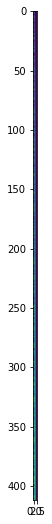

In [53]:
#2.5.3
def boxfiltering (image, sn, theta):
    Lxx, Lyy, Lxy = filtering(image, sn)
    R = Lxx*Lyy - (0.9*Lxy)**2
    blobs = needed_conditions(R, sn, theta)
    kp_data = get_kp_data(blobs, sn)
    n = int (2*np.ceil(3*sn)+1)
    padding = int ( 4*np.floor(n/6)+1 )
    kp_data = [ kp_data[i] for i in range(kp_data.shape[0])
               if  kp_data[i][0] > padding
               and kp_data[i][1] > padding
               and kp_data[i][0] < image.shape[1]-padding
               and kp_data[i][1] < image.shape[0]-padding
              ]
    return kp_data
b1=boxfiltering(I1,1,0.1)
b2=boxfiltering(I2,1,0.1)
interest_points_visualization(RGB_cells, b1)
plt.title('2.5.3 - cells')
interest_points_visualization(RGB_donuts, b2)
plt.title('2.5.3 - donuts')

In [54]:
#2.5.4
def multiboxfiltering(Img_BGR,img_Grey,N,s,s0,theta_corn):
    corners = []
    sigma = []
    L = []
    kp_data2 = []
    coords = [] 
    I = img_Grey.astype(np.float)/img_Grey.max()
    for i in range(N):
        sigma.append(s**i*s0)                   
        corners.append(boxfiltering(Img_BGR,img_Grey,sigma[i],theta_corn))        
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)
        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))
        d1 = (4 * np.floor(n/6) + 1).astype(int) 
        d2 = (2 * np.floor(n/6) + 1).astype(int) 
        x = max(d1//2,3*d2//2)
    for i in range(N):   
        L[i] = np.pad(L[i], ((x, x), (x, x)))
    for i in range(N):  
        coords.append(np.nonzero(corners[i] == 1))
        for j in range(np.sum(corners[i])):
            current = L[i][coords[i][0][j]][coords[i][1][j]]

            if i == 0:
                previous = L[N-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]

            elif i == N-1:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[0][coords[i][0][j]][coords[i][1][j]]

            else:
                previous = L[i-1][coords[i][0][j]][coords[i][1][j]]
                Next =  L[i+1][coords[i][0][j]][coords[i][1][j]]

            if (current > previous) & (current > Next):
                kp_data2.append([coords[i][1][j],coords[i][0][j],sigma[i]])
    return kp_data2 

# 3.1. Ταίριασμα Εικόνων υπό Περιστροφή και Αλλαγή Κλίμακας

In [55]:
#3.1.1
import cv22_lab1_part3_utils as p3
import cv22_lab1_part2_utils as p2

In [56]:
def new_anixnefsi_gonion(I, sn, pa, theta, k): 
    I = I.astype(np.float)/255
    n = int(np.ceil(3*sn)*2+1)
    gaussian = cv2.getGaussianKernel(n,sn) 
    Gs = gaussian @ gaussian.T
    Is = cv2.filter2D(I, -1, Gs)
    
    n = int(np.ceil(3*pa)*2+1)
    gaussian = cv2.getGaussianKernel(n,pa) 
    Gp = gaussian @ gaussian.T
    
    [Ix,Iy]=np.gradient(Is)
    J1 = cv2.filter2D(Ix*Ix, -1, Gp)
    J2 = cv2.filter2D(Ix*Iy, -1, Gp)
    J3 = cv2.filter2D(Iy*Iy, -1, Gp)
    
    lplus=(J1+J3+np.sqrt((J1-J3)**2+4*J2**2))/2
    lminus=(J1+J3-np.sqrt((J1-J3)**2+4*J2**2))/2
    
    R = lminus * lplus - k*(lminus + lplus)**2
    ns = np.ceil(3*sigma)*2+1                             
    B_sq = disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > theta*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8) # or &
    
    coords = np.nonzero(corners == 1)                  
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([coords[1][i],coords[0][i],2])  
    return np.array(kp_data,dtype="object")

In [57]:
def new_HarrisStephens(I,N,s0,p0,s,k, theta_corn):
    sigma = []
    rho = []
    L = []
    coords = [] 
    kp_data2 = []
    #I = img_Grey.astype(np.float)/255
    corners = []
    I = I.astype(np.float)/255
    for i in range(N):
        sigma.append(s**i*s0)                   
        rho.append(s**i*p0)
        corners.append(new_anixnefsi_gonion(I,sigma[i],rho[i],theta_corn,k))
        
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)
        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))
    
    #corners = np.array(corners,dtype="object")
    for i in range(4):
        for j in range(corners[i].shape[0]):
            current = L[i][int(corners[i][j][1])][int(corners[i][j][0])]
            
            if i == 0:
                previous = L[N-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            elif i == N-1:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[0][int(corners[i][j][1])][int(corners[i][j][0])]
                
            else:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            if (current > previous) & (current > Next):
                kp_data2.append([int(corners[i][j][0]),int(corners[i][j][1]),sigma[i]])
                
    return np.array(kp_data2)

In [58]:
def new_blob_detect(I,sigma,Theta_corn,k):
    I = I.astype(np.float)/255
    
    n = int(np.ceil(3*sigma)*2+1)
    gaussian = cv2.getGaussianKernel(n,sigma) 
    gauss2D = gaussian @ gaussian.T
    Is= cv2.filter2D(I, -1, gauss2D)
    
    [Lx,Ly] = np.gradient(Is)
    [Lxx,Lxy] = np.gradient(Lx)
    [Lyx,Lyy] = np.gradient(Ly)
    R = Lxx * Lyy - Lxy * Lxy
    ns = np.ceil(3*sigma)*2+1       
    
    B_sq = p2.disk_strel(ns)
    Cond1 = ( R==cv2.dilate(R,B_sq) )
    Cond2 = (R > Theta_corn*np.amax(R))
    corners = (Cond1*Cond2).astype(np.uint8)
    
    coords = np.nonzero(corners == 1)                  #
    kp_data = []
    for i in range(np.sum(corners)):
        kp_data.append([coords[1][i],coords[0][i],sigma]) 
        
    #img = cv2.cvtColor(Img_BGR, cv2.COLOR_BGR2RGB)
    #return corners
    return np.array(kp_data)

In [59]:
def new_multi_blob_detect(I,N,s0,s,theta_corn,k):
    I = I.astype(np.float)/255
    sigma = []
    L = []
    coords = [] 
    kp_data2 = []
    #I = img_Grey.astype(np.float)/img_Grey.max()
    corners = []
    
    for i in range(N):
        sigma.append(s**i*s0)                   
        corners.append(new_blob_detect(I,sigma[i],theta_corn,k))
    
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)

        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))    
   
    for i in range(4):
        for j in range(corners[i].shape[0]):
            current = L[i][int(corners[i][j][1])][int(corners[i][j][0])]
            
            if i == 0:
                previous = L[N-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            elif i == N-1:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[0][int(corners[i][j][1])][int(corners[i][j][0])]
                
            else:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            if (current > previous) & (current > Next):
                kp_data2.append([int(corners[i][j][0]),int(corners[i][j][1]),sigma[i]])
                
    return np.array(kp_data2)

In [60]:
def newmultiboxfiltering(I,N,s,s0,theta_corn):
    I = I.astype(np.float)/255
    corners = []
    sigma = []
    L = []
    kp_data2 = []
    coords = [] 
    #I = img_Grey.astype(np.float)/img_Grey.max()
    for i in range(N):
        sigma.append(s**i*s0)                   
        corners.append(boxfiltering(I,sigma[i],theta_corn))        
        n = int(np.ceil(3*sigma[i])*2+1)
        gaussian = cv2.getGaussianKernel(n,sigma[i]) 
        gauss2D = gaussian @ gaussian.T
        LoG = cv2.Laplacian(gauss2D, cv2.CV_64F)
        L.append(sigma[i]**2*np.abs(cv2.filter2D(I, -1, LoG)))
        d1 = (4 * np.floor(n/6) + 1).astype(int) 
        d2 = (2 * np.floor(n/6) + 1).astype(int) 
        x = max(d1//2,3*d2//2)
    for i in range(N):   
        L[i] = np.pad(L[i], ((x, x), (x, x)))
        
    corners = np.array(corners,dtype="object")
    
    for i in range(N):
        for j in range(len(corners[i])):
            current = L[i][int(corners[i][j][1])][int(corners[i][j][0])]
            
            if i == 0:
                previous = L[N-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            elif i == N-1:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[0][int(corners[i][j][1])][int(corners[i][j][0])]
                
            else:
                previous = L[i-1][int(corners[i][j][1])][int(corners[i][j][0])]
                Next =  L[i+1][int(corners[i][j][1])][int(corners[i][j][0])]
                
            if (current > previous) & (current > Next):
                kp_data2.append([int(corners[i][j][0]),int(corners[i][j][1]),sigma[i]])
                
    return np.array(kp_data2)

In [61]:
descr=""
variables_ag = {
    'sigma': 2,
    'p': 2,
    'theta_corn': 0.005,
    'k': 0.05
} 

variables_hs = {
    's0': 2,
    'p0': 2.5,
    'k': 0.05,
    'theta_corn': 0.005,
    's': 2,
    'N': 4
} 

variables_bd = {
    'sigma': 2,
    'theta_corn': 0.005, 
    'k': 0.05
} 
variables_mbd = {
    's0': 2,
    'k': 0.05,
    'theta_corn': 0.005,
    's': 2,
    'N': 4
}

variables_mbox = {
    's0': 2,
    'theta_corn': 0.005, 
    's':2,
    'N':4
}
def matching_evaluation(func,flag_surf_hog):
    #choose descriptor
    if(flag_surf_hog==0):
        desc_fun = lambda I, kp: p3.featuresSURF(I,kp)
        descr="SURF"
    elif(flag_surf_hog==1):
        desc_fun = lambda I, kp: p3.featuresHOG(I,kp)
        descr="HOG"
        
    if(func==new_anixnefsi_gonion):
        detect_fun = lambda I: new_anixnefsi_gonion(I, 
                                    variables_ag['sigma'],
                                    variables_ag['p'],
                                    variables_ag['theta_corn'], 
                                    variables_ag['k'])
        
    elif(func==new_HarrisStephens):
        detect_fun = lambda I: new_HarrisStephens(I, 
                                    variables_hs['N'],
                                    variables_hs['s0'],
                                    variables_hs['p0'], 
                                    variables_hs['s'],
                                    variables_hs['k'],
                                    variables_hs['theta_corn'])
    
    elif(func==new_blob_detect):
        detect_fun = lambda I: new_blob_detect(I, 
                                    variables_bd['sigma'],
                                    variables_bd['theta_corn'], 
                                    variables_bd['k'])
    elif(func==new_multi_blob_detect):
        detect_fun = lambda I: new_multi_blob_detect(I, 
                                    variables_mbd['N'],
                                    variables_mbd['s0'], 
                                    variables_mbd['s'], 
                                    variables_mbd['theta_corn'], 
                                    variables_mbd['k'])
   
    elif(func==newmultiboxfiltering):
        detect_fun = lambda I: newmultiboxfiltering(I, 
                                    variables_mbox['N'],
                                    variables_mbox['s'],
                                    variables_mbox['s0'], 
                                    variables_mbox['theta_corn'])  

    avg_scale_errors, avg_theta_errors = p3.matching_evaluation(detect_fun, desc_fun)
    for i in range(1,4):
        print('Avg. Scale Error {} {} for Image {}: {:.3f}'.format(func.__name__,descr, i, avg_scale_errors[i-1]))
        print('Avg. Theta Error {} {} for Image {}: {:.3f}'.format(func.__name__,descr, i, avg_theta_errors[i-1])) 

In [62]:
for i in (0,1):
    matching_evaluation(new_anixnefsi_gonion,i)   
    matching_evaluation(new_HarrisStephens,i) 
    matching_evaluation(new_blob_detect,i) 
    matching_evaluation(new_multi_blob_detect,i)
    matching_evaluation(newmultiboxfiltering,i)     

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Avg. Scale Error new_anixnefsi_gonion SURF for Image 1: 0.002
Avg. Theta Error new_anixnefsi_gonion SURF for Image 1: 0.152
Avg. Scale Error new_anixnefsi_gonion SURF for Image 2: 0.001
Avg. Theta Error new_anixnefsi_gonion SURF for Image 2: 0.208
Avg. Scale Error new_anixnefsi_gonion SURF for Image 3: 0.015
Avg. Theta Error new_anixnefsi_gonion SURF for Image 3: 2.465


C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


Avg. Scale Error new_HarrisStephens SURF for Image 1: 0.002
Avg. Theta Error new_HarrisStephens SURF for Image 1: 0.204
Avg. Scale Error new_HarrisStephens SURF for Image 2: 0.005
Avg. Theta Error new_HarrisStephens SURF for Image 2: 0.244
Avg. Scale Error new_HarrisStephens SURF for Image 3: 0.002
Avg. Theta Error new_HarrisStephens SURF for Image 3: 0.178
Avg. Scale Error new_blob_detect SURF for Image 1: 0.027
Avg. Theta Error new_blob_detect SURF for Image 1: 7.759
Avg. Scale Error new_blob_detect SURF for Image 2: 0.010
Avg. Theta Error new_blob_detect SURF for Image 2: 0.229
Avg. Scale Error new_blob_detect SURF for Image 3: 0.001
Avg. Theta Error new_blob_detect SURF for Image 3: 0.054
Avg. Scale Error new_multi_blob_detect SURF for Image 1: 0.002
Avg. Theta Error new_multi_blob_detect SURF for Image 1: 0.101
Avg. Scale Error new_multi_blob_detect SURF for Image 2: 0.003
Avg. Theta Error new_multi_blob_detect SURF for Image 2: 0.115
Avg. Scale Error new_multi_blob_detect SURF fo

# 3.2. Κατηγοριοποίηση Εικόνων

In [69]:
import numpy as np
import cv2
import sys
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import cv22_lab1_part2_utils as p2
from matplotlib import rcParams
import cv22_lab1_part3_utils as p3
from sklearn.cluster import KMeans
from scipy.spatial import distance
from scipy.spatial.distance import cdist
%matplotlib inline

In [66]:
def convolution(img, kernel):
    result = cv2.filter2D(img, -1, kernel)
    return result
def get_gaussian(sigma, plot = False):
    n = int(np.ceil(3* sigma) *2+1)
    gauss1D = cv2.getGaussianKernel(n, sigma)
    gauss2D = gauss1D @ gauss1D.T
        # plot gaussian
    if plot:
        hf = plt.figure()
        ax = hf.add_subplot(111, projection ='3d')
        X = np.arange(-(n -1) /2,(n -1) /2+1, 1)
        Y = np.arange(-(n -1) /2,(n -1) /2+1, 1)
        X, Y = np.meshgrid(X, Y)
        Z = gauss2D
        ax.plot_surface(X, Y, Z)
        ax.set_xlabel('x')
        ax.set_ylabel('y')
        ax.set_title('Gaussian for sigma = '+str(sigma))
        plt.show()
    return gauss2D
def new_harrislap(img, s, N, sigma, rho, theta, k):
    points = []
    for i in range(N):
        sigma_i = s ** i * sigma
        rho_i = s ** i * rho
        gaussian_sigma_i = get_gaussian(sigma_i)
        gaussian_rho_i = get_gaussian(rho_i)
        (gaus_x_der, gaus_y_der) = np.gradient(gaussian_sigma_i)
        i_s_x = convolution(img, gaus_x_der)
        i_s_y = convolution(img, gaus_y_der)
        j1 = convolution(i_s_x * i_s_x, gaussian_rho_i)
        j2 = convolution(i_s_x * i_s_y, gaussian_rho_i)
        j3 = convolution(i_s_y * i_s_y, gaussian_rho_i)
        l_plus =(j1 + j3 + np.sqrt(np.square(j1 - j3) + 4 * np.square(j2)))/2
        l_minus =(j1 + j3 - np.sqrt(np.square(j1 - j3) + 4 * np.square(j2)))/2
        r = l_minus * l_plus - k * np.square(l_minus + l_plus)
        ns = np . ceil(3* sigma_i) *2+1
        b_sq = p2.disk_strel(ns)
        cond1 =(r == cv2 . dilate(r, b_sq))
        cond2 = r > theta * np .max(r)
        cond = np.logical_and(cond1, cond2)
        result = np.argwhere(cond > 0)
        result[:, [0, 1]] = result[:, [1, 0]]
        res = np.insert(result, 2, sigma_i, axis=1)
        points.append(res)
    metrics = []
    for i in range(N):
        sigma_i =(s ** i) * sigma
        n = int(np.ceil(3*sigma_i)*2+1)
        vect = np.linspace(-(n-1)/2,(n-1)/2, n)
        [xs, ys] = np.meshgrid(vect, vect)
        nom =(np.square(xs) + np.square(ys) - 2*(sigma_i**2))
        den = 2*np.pi*(sigma_i**6)
        exp = np.exp(-(np.square(xs)+np.square(ys))/(2*(sigma_i**2)))
        LoG =(nom/den)*exp
        if plot:
            hf = plt.figure()
            ax = hf.add_subplot(111, projection='3d')
            X = np.arange(-(n - 1) / 2,(n - 1) / 2 + 1, 1)
            Y = np.arange(-(n - 1) / 2,(n - 1) / 2 + 1, 1)
            X, Y = np.meshgrid(X, Y)
            Z = LoG
            ax.plot_surface(X, Y, Z)
            ax.set_xlabel('x')
            ax.set_ylabel('y')
            ax.set_title('LoG for sigma_i = ' + str(sigma_i))
            plt.show()
        log_sigma = LoG
        log = convolution(img, log_sigma)
        normalized_log = sigma_i ** 2 * np.abs(log)
        metrics.append(normalized_log)
    results = []
    for i in range(N):
        for(x, y, sigma) in points[i]:
            if N == 1:
                results.append((x, y, sigma))
            elif i == 0:
                if metrics[i][y][x] >= metrics[i + 1][y][x]:
                    results.append((x, y, sigma))
            elif i == N - 1:
                if metrics[i][y][x] >= metrics[i - 1][y][x]:
                    results.append((x, y, sigma))
            else:
                if metrics[i][y][x] >= metrics[i - 1][y][x] and metrics[i][y][x] >= metrics[i + 1][y][x]:
                    results.append((x, y, sigma))
    res = np.array(results)
    return res

In [80]:
def classification_SURF(func, s, N, sigma, po, theta, k):
    if(func.__name__ == 'new_harrislap'):
        detect_fun = lambda I : func(I ,s ,N ,sigma ,po ,theta ,k)
    elif(func.__name__ == 'new_multi_blob_detect'):
        detect_fun = lambda I : func(I, N, sigma, s, theta, k)
    elif(func.__name__ == 'newmultiboxfiltering'):
        detect_fun = lambda I : func(I, N, s, sigma, theta)
    
    desc_fun = lambda I , kp : p3.featuresSURF(I , kp )
    feats = p3.FeatureExtraction(detect_fun , desc_fun)
    
    accuracy = []
    k1=0.5
    k2=500
    for aaa in range(5):
        data_train, label_train, data_test, label_test = p3.createTrainTest(feats, aaa)

        all_words = np.concatenate(data_train, axis=0)
        np.random.shuffle(all_words)
        km = KMeans(n_clusters=k2, n_init=1, verbose=0)
        km.fit(all_words[:round(k1 * all_words.shape[0])])
        vis_words = km.cluster_centers_
        BOF_tr = np.zeros((len(data_train), k2))
        BOF_ts = np.zeros((len(data_test), k2))
        for i in range(len(data_train)):
            best_indx = np.argmin((cdist(data_train[i], vis_words)), axis=1)
            histogram = np.zeros(k2)
            histogram[0:np.max(best_indx) + 1] = np.bincount(best_indx)
            BOF_tr[i, :] = histogram / (np.linalg.norm(histogram) + np.finfo(float).eps)

        for i in range(len(data_test)):
            best_indx = np.argmin((cdist(data_test[i], vis_words)), axis=1)
            histogram = np.zeros(k2)
            histogram[0:np.max(best_indx) + 1] = np.bincount(best_indx)
            BOF_ts[i, :] = histogram / (np.linalg.norm(histogram) + np.finfo(float).eps)
    
        r1, r2, r3 = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
        accuracy.append(r1)
    print('Mean accuracy for' ,func.__name__, 'with SURF descriptors: {:.3f}%'.format(100.0*np.mean(accuracy)))
    
def classification_HOG(func, s, N, sigma, po, theta, k):
    if(func.__name__ == 'new_harrislap'):
        detect_fun = lambda I : func(I ,s ,N ,sigma ,po ,theta ,k)
    elif(func.__name__ == 'new_multi_blob_detect'):
        detect_fun = lambda I : func(I, N, sigma, s, theta, k)
    elif(func.__name__ == 'newmultiboxfiltering'):
        detect_fun = lambda I : func(I, N, s, sigma, theta)
    desc_fun = lambda I , kp : p3.featuresHOG(I , kp )
    feats = p3.FeatureExtraction(detect_fun , desc_fun , saveFile ='harris_lap_1')
    
    accuracy = []
    k1=0.5
    k2=500
    for aaa in range(5):
        data_train, label_train, data_test, label_test = p3.createTrainTest(feats, aaa)

        all_words = np.concatenate(data_train, axis=0)
        np.random.shuffle(all_words)
        km = KMeans(n_clusters=k2, n_init=1, verbose=0)
        km.fit(all_words[:round(k1 * all_words.shape[0])])
        vis_words = km.cluster_centers_
        BOF_tr = np.zeros((len(data_train), k2))
        BOF_ts = np.zeros((len(data_test), k2))
        for i in range(len(data_train)):
            best_indx = np.argmin((cdist(data_train[i], vis_words)), axis=1)
            histogram = np.zeros(k2)
            histogram[0:np.max(best_indx) + 1] = np.bincount(best_indx)
            BOF_tr[i, :] = histogram / (np.linalg.norm(histogram) + np.finfo(float).eps)

        for i in range(len(data_test)):
            best_indx = np.argmin((cdist(data_test[i], vis_words)), axis=1)
            histogram = np.zeros(k2)
            histogram[0:np.max(best_indx) + 1] = np.bincount(best_indx)
            BOF_ts[i, :] = histogram / (np.linalg.norm(histogram) + np.finfo(float).eps)
    
        r1, r2, r3 = p3.svm(BOF_tr, label_train, BOF_ts, label_test)
        accuracy.append(r1)
    print('Mean accuracy for' ,func.__name__, 'with HOG descriptors: {:.3f}%'.format(100.0*np.mean(accuracy)))

In [70]:
classification_SURF(new_harrislap, 1.5 , 4 , 2 , 2.5 , 0.005 , 0.05)

Time for feature extraction: 176.613
Mean accuracy for new_harrislap with SURF descriptors: 56.552%


In [71]:
classification_HOG(new_harrislap, 1.5 , 4 , 2 , 2.5 , 0.005 , 0.05)

Time for feature extraction: 185.085
Mean accuracy for new_harrislap with HOG descriptors: 60.276%


In [76]:
classification_SURF(new_multi_blob_detect, 2 , 4 , 2 , 0 , 0.005 , 0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Time for feature extraction: 536.616
Mean accuracy for new_multi_blob_detect with SURF descriptors: 57.379%


In [77]:
classification_HOG(new_multi_blob_detect, 2 , 4 , 2 , 0 , 0.005 , 0.05)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Time for feature extraction: 559.660
Mean accuracy for new_multi_blob_detect with HOG descriptors: 64.690%


In [82]:
classification_SURF(newmultiboxfiltering, 1.5 , 4 , 2 , 0 , 0.005 , 0)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Time for feature extraction: 253.058
Mean accuracy for newmultiboxfiltering with SURF descriptors: 56.414%


In [83]:
classification_HOG(newmultiboxfiltering, 1.5 , 4 , 2 , 0 , 0.005 , 0)

C:\ProgramData\Anaconda3\envs\cv_lab1_env\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Time for feature extraction: 263.578
Mean accuracy for newmultiboxfiltering with HOG descriptors: 64.138%
